# Installing Libraries

In [5]:

pip install matplotlib

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


# Display Images

In [6]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


In [7]:
imageDir = '/home/om/CODE/opencv/lane_detection/data/images/'
imageFiles = os.listdir(imageDir)
imageList = []
for i in range(0, len(imageFiles)):
    imageList.append(mpimg.imread(imageDir + imageFiles[i]))

def display_images(images, cmap= None):
    plt.figure(figsize=(40,40))
    for i, image in enumerate(images):
        plt.subplot(3,2,i+1)
        plt.imshow(image, cmap)
        plt.autoscale(tight=True)
    plt.show()

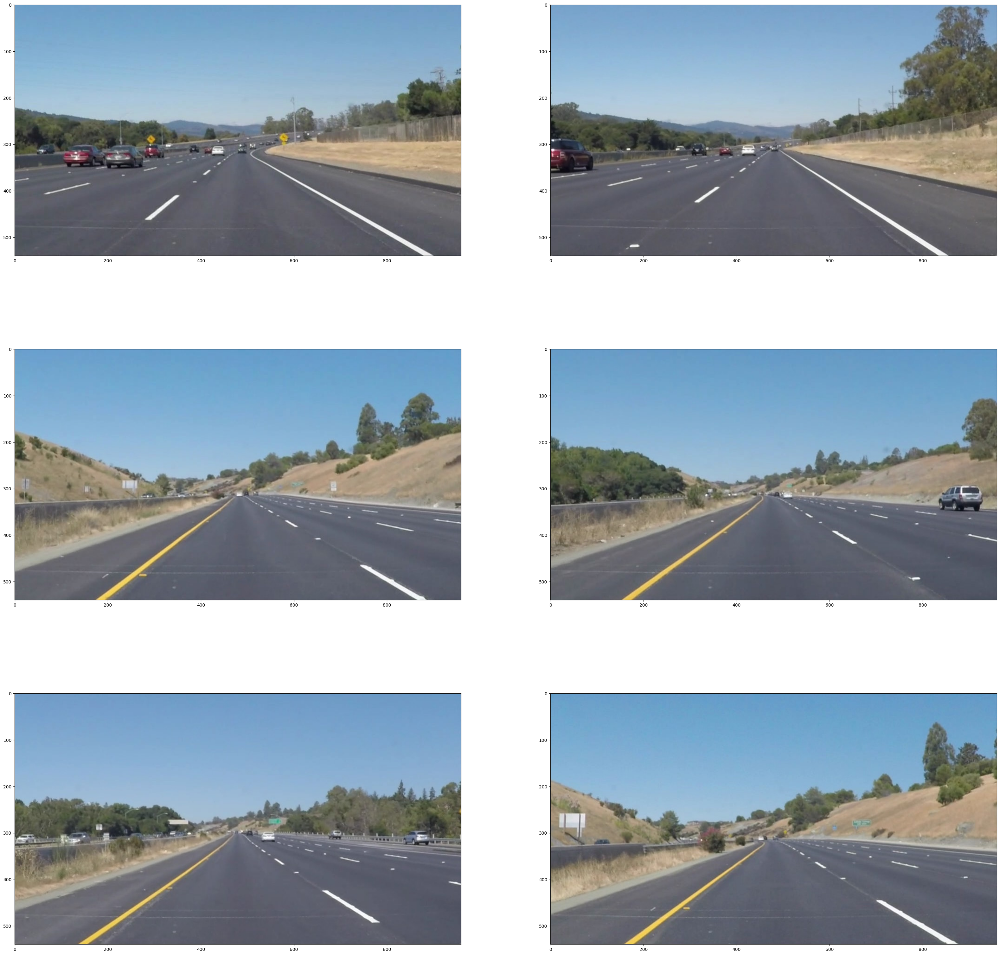

In [8]:
display_images(imageList)

# Color Filtering

In [9]:
pip install opencv-python


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [10]:
import cv2
import numpy as np

In [11]:
image = cv2.imread('/home/om/CODE/opencv/lane_detection/data/images/solidWhiteCurve.jpg')
hls =  cv2.cvtColor(image, cv2.COLOR_RGB2HLS)

In [12]:
# cv2.imshow("HLS Image",hls)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

In [13]:
def color_filtering(image):
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    lower = np.array([0,190,0])
    upper = np.array([255,255,255])
    yellower = np.array([10,0,90])
    yelupper = np.array([50,255,255])
    yellowmask = cv2.inRange(hls, yellower, yelupper)
    whitemask = cv2.inRange(hls, lower, upper)
    mask = cv2.bitwise_or(yellowmask, whitemask)
    masked = cv2.bitwise_and(image, image, mask = mask)
    return masked

In [14]:
filtered_img = list(map(color_filtering, imageList))

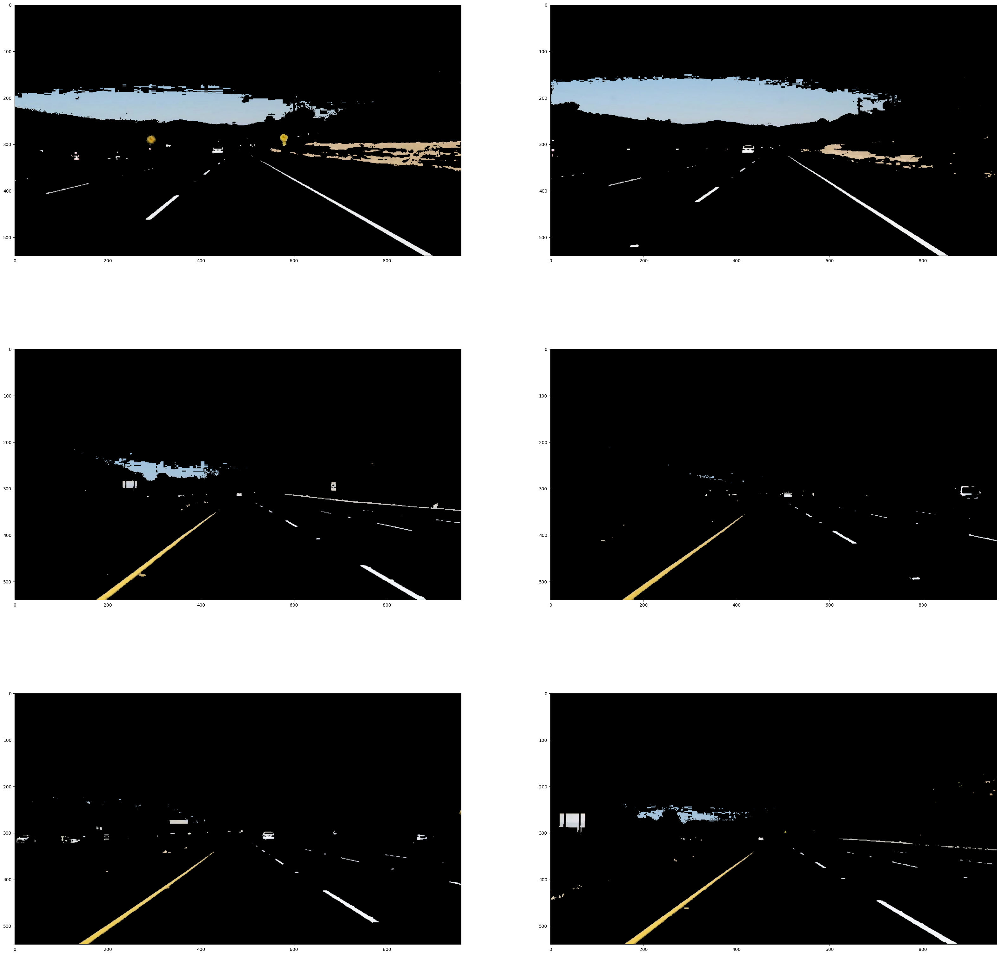

In [15]:
display_images(filtered_img)

# Region of Interest

In [16]:
def roi(img):
    x = int(img.shape[1])
    y = int(img.shape[0])
    shape = np.array([[int(0), int(y)], 
                      [int(x), int(y)], 
                      [int(0.55*x), int(0.6*y)], 
                      [int(0.45*x), int(0.6*y)]
                     ])
    mask = np.zeros_like(img)
    if len(img.shape) > 2:
        channel_count = img.shape[2]
        ignore_mask_color = (255, )* channel_count
    else:
        ignore_mask_color = 255

    cv2.fillPoly(mask, np.int32([shape]), ignore_mask_color)
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

In [17]:
roi_imag = list(map(roi, filtered_img))

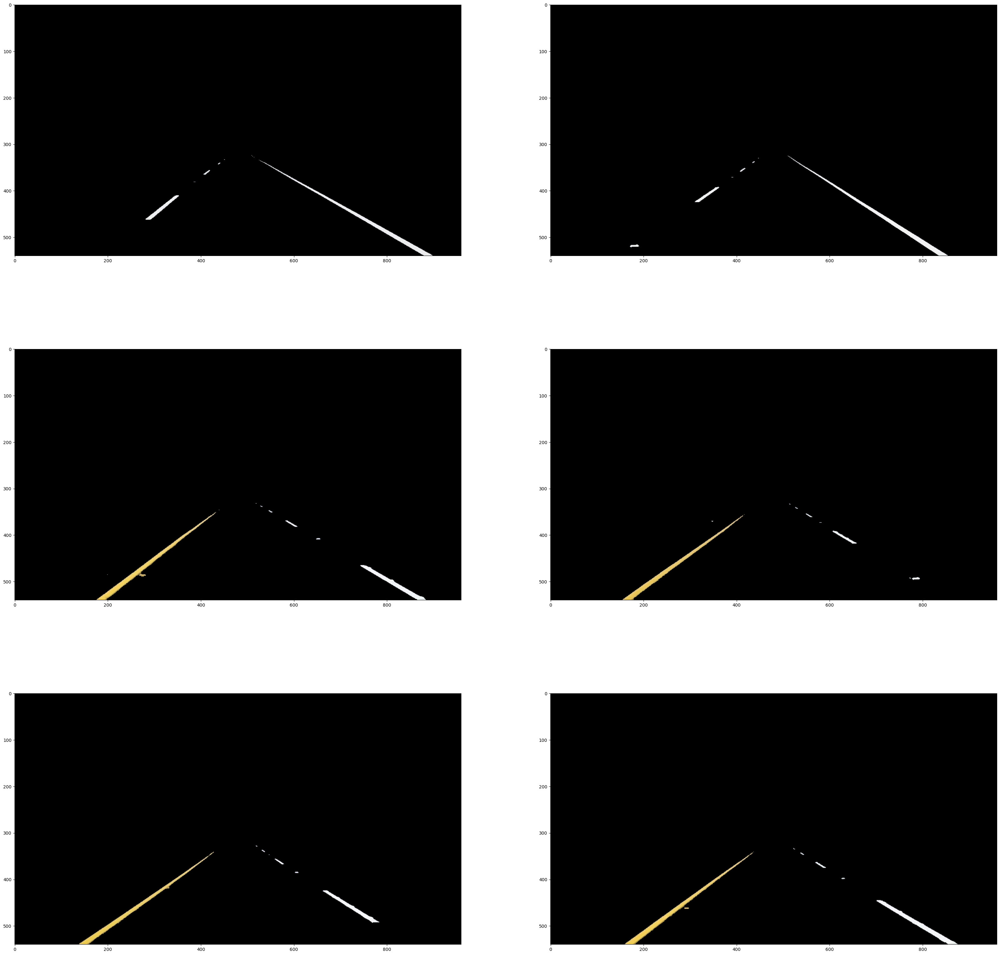

In [18]:
display_images(roi_imag)

# Canny Edge Detection

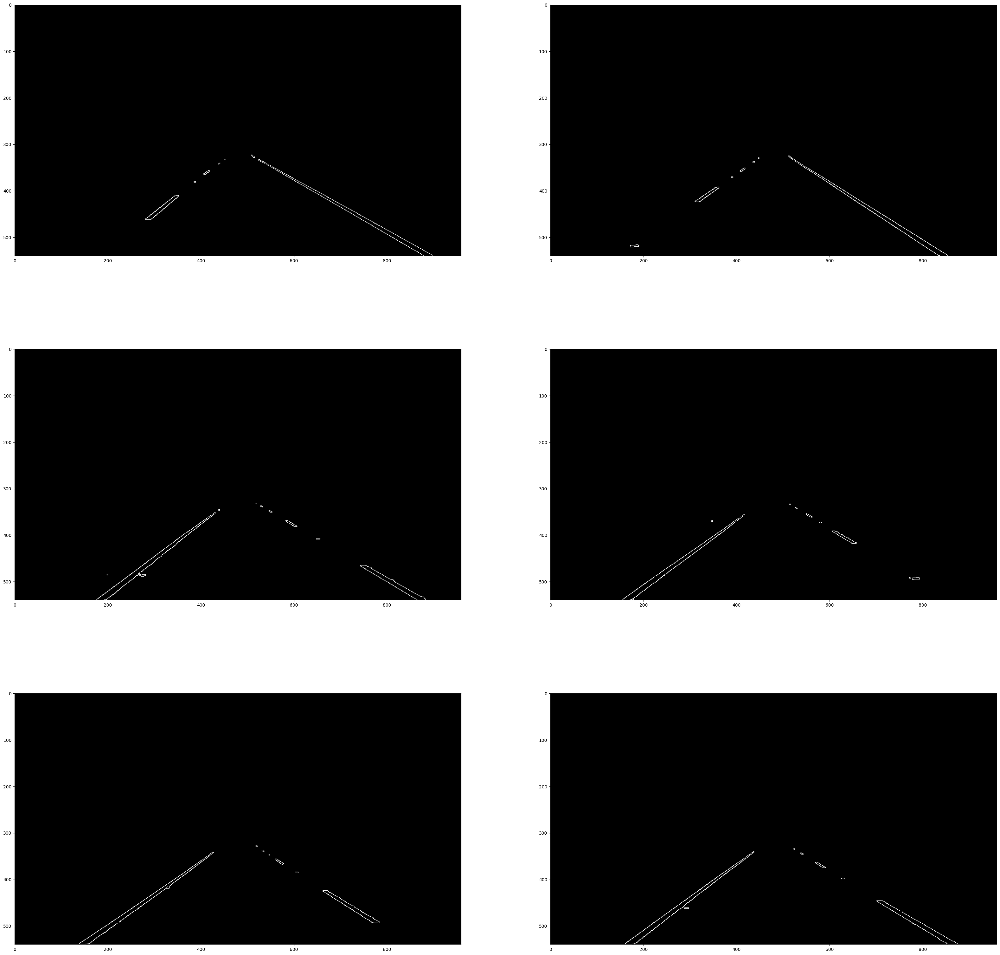

In [19]:
def grayscale(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
def canny(img):
    return cv2.Canny(grayscale(img), 50, 120)

canny_img = list(map(canny, roi_imag))
display_images(canny_img, cmap='gray')

# Hough Line Detection

In [20]:
rightSlope, leftSlope, rightIntercept , leftIntercept = [], [], [], []
def draw_lines(img, lines, thickness=5):
    global rightSlope , leftSlope, rightIntercept, leftIntercept
    rightColor = [0,255,0]
    leftColor = [255,0,0]

    for line in lines:
        for x1,y1,x2,y2 in line:
            slope = (y1-y2)/(x1-x2)
            if slope > 0.3:
                if x1 > 500:
                    yintercept = y2 - (slope*x2)
                    rightSlope.append(slope)
                    rightIntercept.append(yintercept)
                else: None
            elif slope < -0.3:
                if x1 < 600:
                    yintercept = y2 - (slope*x2)
                    leftSlope.append(slope)
                    leftIntercept.append(yintercept)

    leftavgSlope = np.mean(leftSlope[-30:])
    leftavgIntercept = np.mean(leftIntercept[-30:])

    rightavgSlope = np.mean(rightSlope[-30:])
    rightavgIntercept = np.mean(rightIntercept[-30:])

    try:
        left_line_y1 = 0.65*img.shape[0]
        left_line_y2 = img.shape[0] 

        right_line_y1 = 0.65*img.shape[0]
        right_line_y2 = img.shape[0]

        left_line_x1 = int((left_line_y1 - leftavgIntercept)/leftavgSlope)
        left_line_x2 = int((left_line_y2 - leftavgIntercept)/leftavgSlope)

        right_line_x1 = int((right_line_y1 - rightavgIntercept)/rightavgSlope)
        right_line_x2 = int((right_line_y2 - rightavgIntercept)/rightavgSlope)

        pts = np.array([[left_line_x1 ,int(left_line_y1)], 
                        [left_line_x2, int(left_line_y2)],
                        [right_line_x2, int(right_line_y2)],
                        [right_line_x1, int(right_line_y1)]],
                        np.int32)
        
        pts = pts.reshape(-1,1,2)
        #made a list of pts represented as [pts]
        cv2.fillPoly(img, [pts], (0,0,255))

        cv2.line(img, (left_line_x1, int(left_line_y1)),
                      (left_line_x2, int(left_line_y2)), leftColor, 10)
        cv2.line(img, (right_line_x1, int(right_line_y1)),
                      (right_line_x2, int(right_line_y2)), rightColor, 10)
        
    except ValueError:
        pass

def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength = min_line_len, maxLineGap = max_line_gap)
    #empty image array(black)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype = np.uint8)
    draw_lines(line_img, lines)

    return line_img

def linedetect(img):
    return hough_lines(img, 1, np.pi/180, 10, 20, 100)


In [21]:
#hough_img = [linedetect(img) for img in canny_img]

# hough_img = []
# for img in canny_img:
#     hough_img.append(linedetect(img))

hough_img = list(map(linedetect, canny_img))

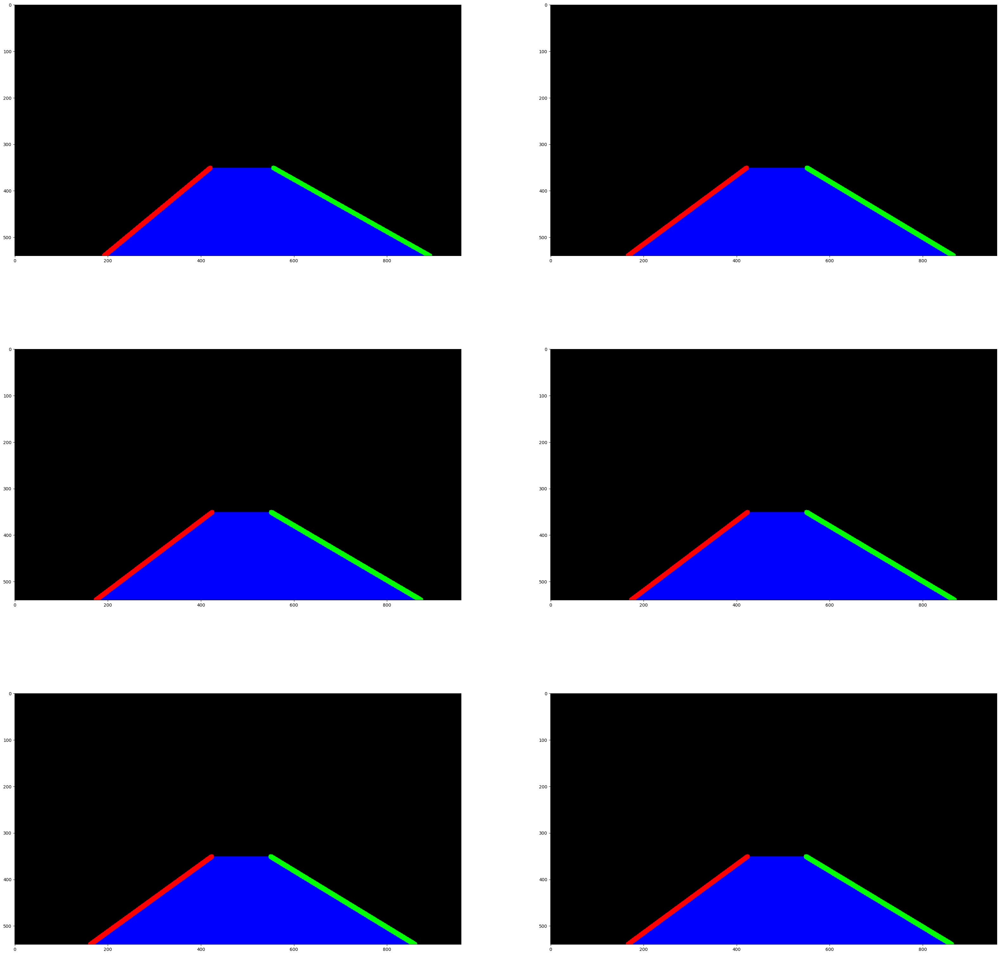

In [22]:
display_images(hough_img)

# Overlay Detected Lane

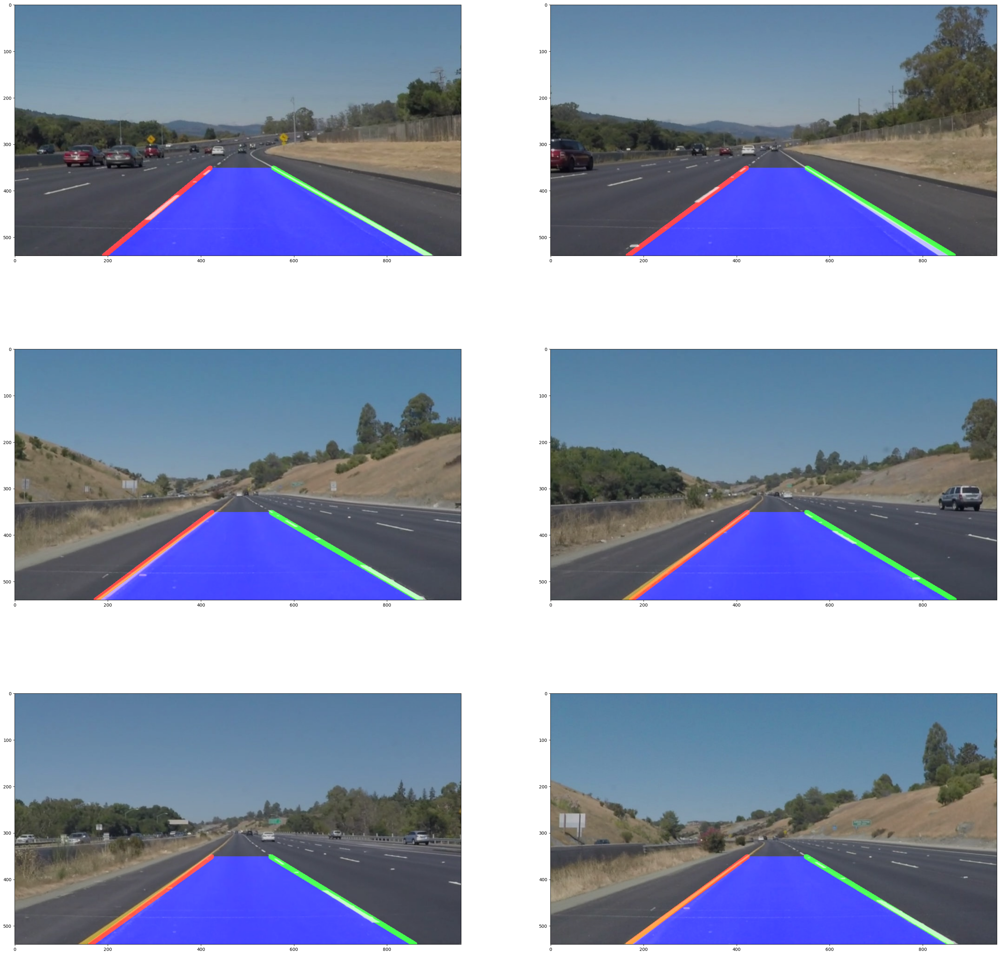

In [23]:
def weightSum(input_set):
    img = list(input_set)
    return cv2.addWeighted(img[0], 1, img[1], 0.8, 0)

result_img = list(map(weightSum, zip(hough_img, imageList)))
display_images(result_img)

# Applying this to video

In [24]:
pip install moviepy==1.0.3 numpy>=1.18.1 imageio>=2.5.0 decorator>=4.3.0 tqdm>=4.0.0 Pillow>=7.0.0 scipy>=1.3.0 pydub>=0.23.0 audiofile>=0.0.0 opencv-python>=4.5


Note: you may need to restart the kernel to use updated packages.


In [25]:
pip show moviepy

Name: moviepy
Version: 1.0.3
Summary: Video editing with Python
Home-page: https://zulko.github.io/moviepy/
Author: Zulko 2017
Author-email: 
License: MIT License
Location: /home/om/.local/lib/python3.10/site-packages
Requires: decorator, imageio, imageio-ffmpeg, numpy, numpy, proglog, requests, tqdm
Required-by: 
Note: you may need to restart the kernel to use updated packages.


In [26]:
from moviepy.editor import *

In [27]:
from moviepy.editor import VideoFileClip

def processImage(image):
    interest = roi(image)
    filterimg = color_filtering(interest)
    canny = cv2.Canny(grayscale(filterimg), 50, 120)
    myLine = hough_lines(canny, 1, np.pi/180, 10,20,5)
    weighted_img = cv2.addWeighted(myLine, 1, image, 0.8, 0)
    return weighted_img

In [28]:
output1 = 'test_videos_output/solidYellowLeft.mp4'
clip1 = VideoFileClip("/home/om/CODE/opencv/lane_detection/data/test_videos/solidYellowLeft.mp4")

pclip1 = clip1.fl_image(processImage)

%time pclip1.write_videofile(output1, audio=False)

Moviepy - Building video test_videos_output/solidYellowLeft.mp4.
Moviepy - Writing video test_videos_output/solidYellowLeft.mp4



Moviepy - Done !
Moviepy - video ready test_videos_output/solidYellowLeft.mp4
CPU times: user 7.62 s, sys: 4.49 s, total: 12.1 s
Wall time: 5.33 s


In [29]:
from moviepy.editor import VideoFileClip

# Check if you can load a video
clip = VideoFileClip("/home/om/CODE/opencv/lane_detection/data/test_videos/solidYellowLeft.mp4")
print(clip.duration)


27.24


In [30]:
first_frame = 1
white_output = 'test_videos_output/solidYellowLeft.mp4'
clip1 = VideoFileClip("/home/om/CODE/opencv/lane_detection/data/test_videos/solidYellowLeft.mp4")
white_clip = clip1.fl_image(processImage)
white_clip.write_videofile(white_output, audio=False)

Moviepy - Building video test_videos_output/solidYellowLeft.mp4.
Moviepy - Writing video test_videos_output/solidYellowLeft.mp4



Moviepy - Done !
Moviepy - video ready test_videos_output/solidYellowLeft.mp4


In [31]:
import os

output_dir = "test_videos_output"
if not os.path.exists(output_dir):
    print("no path exists")
else:
    print("path exists")

path exists


In [32]:
ffmpeg --version

NameError: name 'ffmpeg' is not defined

In [ ]:
pip install ffmpeg

Defaulting to user installation because normal site-packages is not writeable
  Preparing metadata (setup.py) ... done
  Created wheel for ffmpeg: filename=ffmpeg-1.4-py3-none-any.whl size=6084 sha256=33b4c34c7a0cbcccc35babab880676078a27e150d5f4cb4d1e555461e87323e8
  Stored in directory: /home/om/.cache/pip/wheels/8e/7a/69/cd6aeb83b126a7f04cbe7c9d929028dc52a6e7d525ff56003a
Successfully built ffmpeg
Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip show ffmpeg

Name: ffmpeg
Version: 1.4
Summary: ffmpeg python package url [https://github.com/jiashaokun/ffmpeg]
Home-page: https://github.com/jiashaokun/ffmpeg
Author: SkeyJIA
Author-email: 363604236@qq.com
License: MIT Licence
Location: /home/om/.local/lib/python3.10/site-packages
Requires: 
Required-by: 
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import imageio
imageio.plugins.ffmpeg.download()


RuntimeError: imageio.ffmpeg.download() has been deprecated. Use 'pip install imageio-ffmpeg' instead.'